# <a href="https://miptstats.github.io/courses/ad_fivt.html">Введение в анализ данных</a>
## Домашнее задание 2. Простой анализ данных.

**Правила, <font color="red">прочитайте внимательно</font>:**

* Выполненную работу нужно отправить телеграм-боту `@miptstats_ds23_bot`. Для начала работы с ботом каждый раз отправляйте `/start`. Дождитесь подтверждения от бота, что он принял файл. Если подтверждения нет, то что-то не так. **Работы, присланные иным способом, не принимаются.**
* Дедлайн см. в боте. После дедлайна работы не принимаются кроме случаев наличия уважительной причины.
* Прислать нужно **ноутбук в формате `ipynb`** и html-версии графиков (подробности в условии).
* Телеграм не разрешает боту получать файлы более **20 Мб**. Если ваше решение весит больше, *заранее* разделите ноутбук на несколько.
* Выполнять задание необходимо полностью самостоятельно. **При обнаружении списывания все участники списывания будут сдавать устный зачет.**
* Решения, размещенные на каких-либо интернет-ресурсах, не принимаются. Кроме того, публикация решения в открытом доступе может быть приравнена к предоставлении возможности списать.
* Для выполнения задания **используйте этот ноутбук в качестве основы, ничего не удаляя из него**. Можно добавлять необходимое количество ячеек.
* Комментарии к решению пишите в markdown-ячейках.
* Выполнение задания (ход решения, выводы и пр.) должно быть осуществлено на русском языке.
* Если код будет не понятен проверяющему, оценка может быть снижена.
* Никакой код из данного задания при проверке запускаться не будет. *Если код студента не выполнен, недописан и т.д., то он не оценивается.*
* **Код из рассказанных на занятиях ноутбуков** можно использовать без ограничений.

**Перед выполнением задания посмотрите презентацию по выполнению и оформлению домашних заданий с занятия 1.**

---

**Баллы за задание:**

<b><font color="orange">Сложная часть</font></b> (необходимо на "отл"):
* Задача 2 &mdash; 80 баллов

---

In [1]:
# Bot check

# HW_ID: fpmi_ad2
# Бот проверит этот ID и предупредит, если случайно сдать что-то не то

# Status: not final
# Перед отправкой в финальном решении удали "not" в строчке выше
# Так бот проверит, что ты отправляешь финальную версию, а не промежуточную

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

sns.set(style='whitegrid', font_scale=1.3, palette='Set2')


---
### <font color="orange"><i>Сложная часть</i></font>

### Задача 2

<a target="_blank" href="https://www.yelp.com/">Yelp</a> — веб-сайт для поиска на местном рынке услуг, например ресторанов или парикмахерских, с возможностью добавлять и просматривать рейтинги и обзоры этих услуг. Для популярных бизнесов имеются сотни обзоров. Для обозревателей на сайте предусмотрены элементы социальной сети.

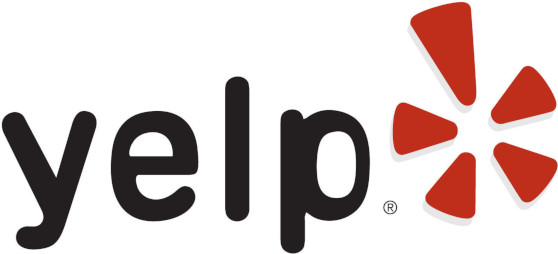

_____________

Вам предоставляется следующая информация о компаниях на Yelp:

Файл `yelp_business.csv`:
* `business_id` — уникальный идентификатор компании;
* `name` — имя компании;
* `address`, `city`, `state` — месторасположении компании;
* `latitude`, `longitude` — географические координаты;
* `categories` — категории услуг компании.

Файл `yelp_review.csv`, содержащий оценки пользователей:
* `business_id` — идентификатор компании, соответствующий файлу `yelp_business.csv`;
* `stars` — поставленная пользователем оценка от 1 до 5.

В целях сокращения объема файла, текстовые отзывы пользователей не были включены.

Оригинальную версию датасета в формате `json` можно посмотреть по <a target="_blank" href="https://www.kaggle.com/yelp-dataset/yelp-dataset/data">ссылке</a>, но использовать нужно выданные данные.

_____________

**Что нужно сделать:** 

* Найти город с наибольшим количеством компаний;
* Для этого города определить районы с наиболее качественными услугами. <a target="_blank" href="https://yandex.ru/company/researches/2017/msk_mobile_map">Пример</a> с несколько другой задачей.
* А также найти рестораны с наилучшими отзывами.


*Далее в условии встречаются различные подсказки, как можно выполнить определенные части задачи. Вы можете их игнорировать и делать иным способом для получения **того же самого промежуточного результата**. Однако, если ваше решение окажется **значительно** менее эффективным (по скорости, количеству и красоте кода) по сравнению с предполагаемым, баллы могут быть снижены.* 

------

#### 1. Город с наибольшим количеством компаний

Загрузите данные из файла `yelp_business.csv` с помощью функции `pd.read_csv`. Посмотрите на первые несколько строк с помощью метода `head`.

In [3]:
df = pd.read_csv('yelp_business.csv', index_col=0)

In [4]:
df.head()

,business_id,name,neighborhood,address,city,state,postal_code,latitude,longitude,is_open,categories
0,FYWN1wneV18bWNgQjJ2GNg,"""Dental by Design""",NaN,"""4855 E Warner Rd, Ste B9""",Ahwatukee,AZ,85044,33.330690,-111.978599,1,Dentists;General Dentistry;Health & Medical;Or...
1,He-G7vWjzVUysIKrfNbPUQ,"""Stephen Szabo Salon""",NaN,"""3101 Washington Rd""",McMurray,PA,15317,40.291685,-80.104900,1,Hair Stylists;Hair Salons;Men's Hair Salons;Bl...
2,KQPW8lFf1y5BT2MxiSZ3QA,"""Western Motor Vehicle""",NaN,"""6025 N 27th Ave, Ste 1""",Phoenix,AZ,85017,33.524903,-112.115310,1,Departments of Motor Vehicles;Public Services ...
3,8DShNS-LuFqpEWIp0HxijA,"""Sports Authority""",NaN,"""5000 Arizona Mills Cr, Ste 435""",Tempe,AZ,85282,33.383147,-111.964725,0,Sporting Goods;Shopping
4,PfOCPjBrlQAnz__NXj9h_w,"""Brick House Tavern + Tap""",NaN,"""581 Howe Ave""",Cuyahoga Falls,OH,44221,41.119535,-81.475690,1,American (New);Nightlife;Bars;Sandwiches;Ameri...


Найдите пять городов, по которым присутствует информация о наибольшем количестве компаний. В таблице должен быть указан город (название) и количество компаний в этом городе.

*Подсказка.* Для выполнения стоит воспользоваться методами `groupby`, `count`, `sort_values`, `head`.

In [5]:
print(df.columns)

Index(['business_id', 'name', 'neighborhood', 'address', 'city', 'state',
       'postal_code', 'latitude', 'longitude', 'is_open', 'categories'],
      dtype='object')


In [6]:
df2 = df.groupby(['city'])['business_id'].count().sort_values(ascending=False).head(5)
df2

city
Las Vegas     26775
Phoenix       17213
Toronto       17206
Charlotte      8553
Scottsdale     8228
Name: business_id, dtype: int64

Пусть `N` &mdash; город с наибольшим количеством компаний. Оставьте в таблице только записи, соответствующие городу `N`. Нанесите все эти компании на график, в котором по оси $x$ отметьте долготу, а по оси $y$ &mdash; широту.

In [7]:
df_city = df[df['city'] == 'Las Vegas']
df_city

,business_id,name,neighborhood,address,city,state,postal_code,latitude,longitude,is_open,categories
6,kCoE3jvEtg6UVz5SOD3GVw,"""BDJ Realty""",Summerlin,"""2620 Regatta Dr, Ste 102""",Las Vegas,NV,89128,36.207430,-115.268460,1,Real Estate Services;Real Estate;Home Services...
7,OD2hnuuTJI9uotcKycxg1A,"""Soccer Zone""",NaN,"""7240 W Lake Mead Blvd, Ste 4""",Las Vegas,NV,89128,36.197484,-115.249660,1,Shopping;Sporting Goods
26,VBHEsoXQb2AQ76J9l8h1uQ,"""Alfredo's Jewelry""",Southeast,"""5775 S Eastern, Ste 103""",Las Vegas,NV,89119,36.085051,-115.119421,1,Shopping;Jewelry;Watch Repair;Local Services
41,1Jp_hmPNUZArNqzpbm7B0g,"""Task Electric""",Spring Valley,"""7260 Cimarron Rd, Ste 130""",Las Vegas,NV,89113,36.056382,-115.269332,1,Home Services;Lighting Fixtures & Equipment;Lo...
48,DPQnTnNw2PJj7DdENM98Cw,"""Star Nursery""",NaN,"""5340 Boulder Hwy""",Las Vegas,NV,89122,36.105196,-115.056880,1,Nurseries & Gardening;Home & Garden;Shopping
...,...,...,...,...,...,...,...,...,...,...,...
174539,swjz4q8gI79Ndg4APuHEUA,"""Stonegate Real Estate Services""",Westside,"""3030 S Jones Blvd, Ste 105""",Las Vegas,NV,89146,36.134355,-115.224462,1,Real Estate Services;Home Services;Property Ma...
174545,pUhU5ohYv65g8B47dTXAKA,"""Starbucks""",NaN,"""591 N Eastern Ave, Ste 110""",Las Vegas,NV,89101,36.173589,-115.116779,1,Coffee & Tea;Food
174546,sH9WsMj8sNTTSAUWv4UEEg,"""Sprint Store""",Southwest,"""7325 S Rainbow Blvd, Ste 120""",Las Vegas,NV,89139,36.055130,-115.243488,1,Mobile Phone Accessories;Mobile Phones;Electro...
174552,9ouC6BpmjFpLfHeQnLQqng,"""9 Dragons Fight Shop""",Westside,"""3375 S Decatur Blvd, Ste 7""",Las Vegas,NV,89102,36.128780,-115.208990,1,Martial Arts;Sports Wear;Men's Clothing;Sporti...


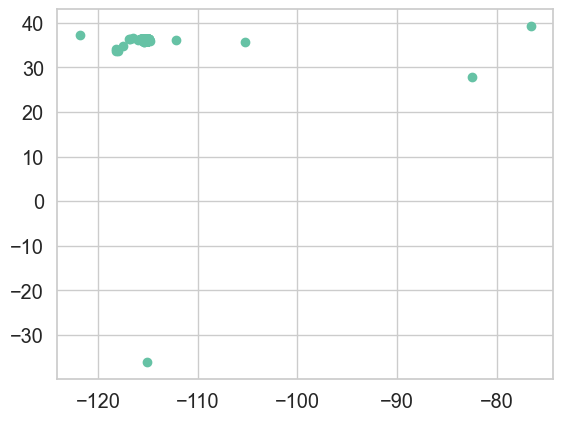

In [8]:
plt.scatter(
    df_city['longitude'],
    df_city['latitude']
)
plt.show()

Сам город находится в сгустке точек. Есть какие-то компании, которые приписаны к этому городу, но находятся далеко от него. Избавьтесь от них, подобрав некоторые границы значений широты и долготы. Изобразите все компании на новом графике. На этом графике должны выделяться некоторые улицы. 

In [9]:
df_city = df_city[(df_city['longitude'] >= -115.4) & (df_city['longitude'] <= -115.0) & (df_city['latitude'] >= 36.0) 
& (df_city['latitude'] <= 36.3)]

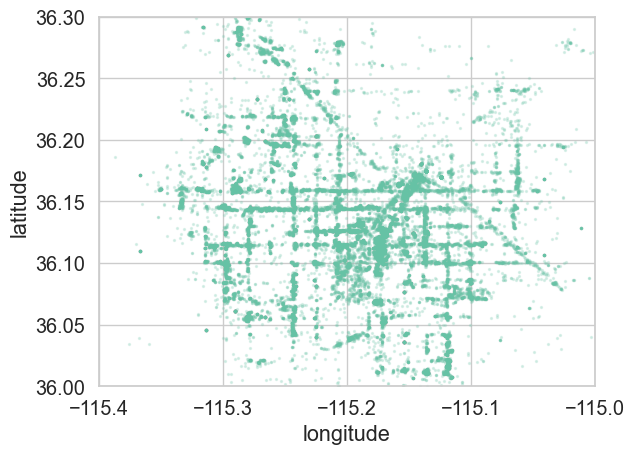

In [10]:
plt.scatter(df_city['longitude'], df_city['latitude'], s=2, alpha=0.2)
plt.xlim(-115.4, -115.0)
plt.ylim(36.0, 36.3)
plt.xlabel('longitude')
plt.ylabel('latitude')
plt.show()

Разберитесь с тем, как подгрузить интерактивную карту города в качестве фона графика. Можно пойти двумя следующими способами.
1. Изучить <a href="https://miptstats.github.io/courses/python/11_plotly.html" target="_blank">материалы</a> по библиотеке <a href="https://plotly.com/python/" target="_blank"><b>Plotly</b></a>. Возможно, потребуется также заглянуть в документацию.
1. Поразбираться с библиотекой <a href="https://github.com/python-visualization/folium" target="_blank"><b>Folium</b></a>. Посмотрите множество <a href="https://nbviewer.org/github/python-visualization/folium/tree/main/examples/" target="_blank">примеров</a>, может также помочь <a href="https://proglib.io/p/python-web-map" target="_blank">статья на русском</a>.

*Внимание!* Интерактивная карта может не сохраниться в ноутбуке, а если сохранится, то вес ноутбука может превзойти 20 Мб, и его не получится отправить боту. В любом случае **<u>необходимо сохранить карту в html и отправить ее отдельным файлом в бот.</u>** При этом каждый файл html должен не превышать 20 Мб, присылать файлы в архиве нельзя. Аналогично со всеми следующими интерактивными графиками в этом задании.

In [11]:
import plotly
import plotly.graph_objects as go
import plotly.express as px

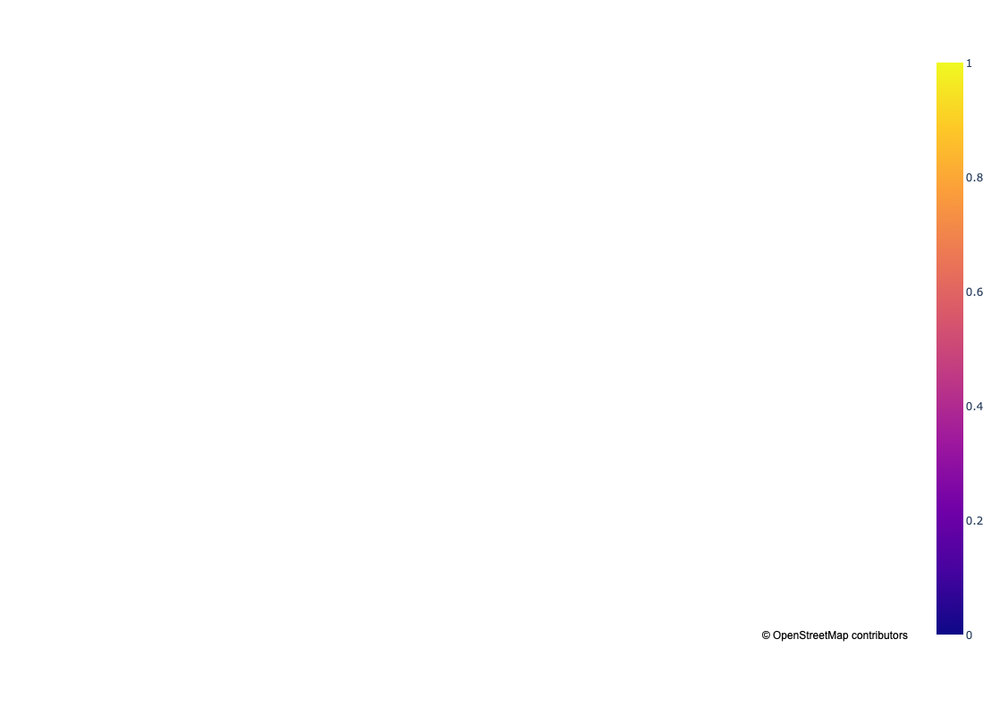

In [12]:
fig = px.density_mapbox(
    df_city,
    lat='latitude', lon='longitude',
    radius=2,
    center=dict(lat=36.146, lon=-115.18),
    zoom=10,
    mapbox_style='open-street-map', 
    width=800,
    height=800
)
fig.show()
fig.write_html("df_city.html")

Если все получилось, вы молодцы! Далее в этой задаче тоже стройте интерактивные карты. Если нет желания разбираться с интерактивными графиками, можно построить статичные, но баллы будут снижены.

#### 2. Оценки компаний

Для выполнения задания нужно посчитать среднюю оценку каждой компании, а также количество выставленных оценок.

Загрузите таблицу оценок `yelp_review.csv`.

In [13]:
review = pd.read_csv('yelp_review.csv', index_col=0)
review.head()

,business_id,stars
0,AEx2SYEUJmTxVVB18LlCwA,5
1,VR6GpWIda3SfvPC-lg9H3w,5
2,CKC0-MOWMqoeWf6s-szl8g,5
3,ACFtxLv8pGrrxMm6EgjreA,4
4,s2I_Ni76bjJNK9yG60iD-Q,4


В подгруженной таблице оценок оставьте только компании города `N`. Для этого установите значения `business_id` в качестве индекса у таблицы оценок и воспользуйтесь методом `loc`. 

*Подсказка.* Чтобы индекс снова сделать полем таблицы, можно воспользоваться методом `reset_index`.

In [14]:
review.set_index("business_id", inplace=True)
city_review = review.loc[df_city["business_id"]]
city_review.reset_index(inplace = True)
city_review

,business_id,stars
0,kCoE3jvEtg6UVz5SOD3GVw,4
1,kCoE3jvEtg6UVz5SOD3GVw,1
2,kCoE3jvEtg6UVz5SOD3GVw,5
3,kCoE3jvEtg6UVz5SOD3GVw,5
4,kCoE3jvEtg6UVz5SOD3GVw,5
...,...,...
1586553,9ouC6BpmjFpLfHeQnLQqng,5
1586554,9ouC6BpmjFpLfHeQnLQqng,5
1586555,n9a-3YhibkMDUEgncIivHg,5
1586556,n9a-3YhibkMDUEgncIivHg,1


Теперь посчитайте среднюю оценку каждой компании, а также количество выставленных компании оценок. 

*Подсказка.* Помочь в этом могут функции `groupby` и `aggregate([np.mean, np.size])`.

In [15]:
city_review_stars = city_review[['business_id', 'stars']]

In [16]:
city_stars_results = city_review_stars.groupby(['business_id']).aggregate([np.mean, np.size])
city_stars_results

stars      
                            mean  size
business_id                           
--9e1ONYQuAa-CB_Rrw7Tw  4.088904  1451
--DdmeR16TRb3LsjG0ejrQ  3.200000     5
--WsruI0IGEoeRmkErU5Gg  4.928571    14
--Y7NhBKzLTbNliMUX_wfg  4.875000     8
--e8PjCNhEz32pprnPhCwQ  3.473684    19
...                          ...   ...
zzOo9n22fBbKAhbSpMzggA  3.230769    26
zzXuJF6UUT1kgTyCsmgDmQ  5.000000     4
zzjqFOujmM9surbMANZ_ag  5.000000     3
zzsKbL1KMNJqazSqBXskxQ  3.666667     6
zzzaIBwimxVej4tY6qFOUQ  3.432432    37

[26290 rows x 2 columns]

Назовите колонки таблицы красивыми именами, изменив `<имя таблицы>.columns`, после чего напечатайте несколько строк полученной таблицы. Красивые имена &mdash; то, что будет понятно простому человеку при чтении ваших результатов. Как именно их назвать &mdash; задача аналитика, то есть в данном случае ваша :)

In [17]:
city_stars_results.columns = ["rating", "number_of_ratings"]
city_stars_results

,rating,number_of_ratings
business_id,,
--9e1ONYQuAa-CB_Rrw7Tw,4.088904,1451
--DdmeR16TRb3LsjG0ejrQ,3.200000,5
--WsruI0IGEoeRmkErU5Gg,4.928571,14
--Y7NhBKzLTbNliMUX_wfg,4.875000,8
--e8PjCNhEz32pprnPhCwQ,3.473684,19
...,...,...
zzOo9n22fBbKAhbSpMzggA,3.230769,26
zzXuJF6UUT1kgTyCsmgDmQ,5.000000,4
zzjqFOujmM9surbMANZ_ag,5.000000,3


Соедините две полученные ранее таблицы по компаниям города `N` в одну.
Для этого сначала установите поле `business_id` в качестве индекса в обеих таблицах с помощью `set_index`. В одной из них это уже должно было быть сделано.
В полученной таблице должны получится поля `latitude`, `longitude`, `categories`, `name`, а также две колонки со средней оценкой компаний и количеством оценок, которые вы посчитали выше.

*Подсказка.* Соединение таблиц можно выполнить с помощью `join`.
Индексы у этих таблиц одинаковые, так что тип джойна не имеет значения.

In [18]:
df_city.set_index("business_id", inplace=True)

In [19]:
df_city_categories = df_city[["latitude", "longitude", "categories", "name"]]
df_city_categories

,latitude,longitude,categories,name
business_id,,,,
kCoE3jvEtg6UVz5SOD3GVw,36.207430,-115.268460,Real Estate Services;Real Estate;Home Services...,"""BDJ Realty"""
OD2hnuuTJI9uotcKycxg1A,36.197484,-115.249660,Shopping;Sporting Goods,"""Soccer Zone"""
VBHEsoXQb2AQ76J9l8h1uQ,36.085051,-115.119421,Shopping;Jewelry;Watch Repair;Local Services,"""Alfredo's Jewelry"""
1Jp_hmPNUZArNqzpbm7B0g,36.056382,-115.269332,Home Services;Lighting Fixtures & Equipment;Lo...,"""Task Electric"""
DPQnTnNw2PJj7DdENM98Cw,36.105196,-115.056880,Nurseries & Gardening;Home & Garden;Shopping,"""Star Nursery"""
...,...,...,...,...
swjz4q8gI79Ndg4APuHEUA,36.134355,-115.224462,Real Estate Services;Home Services;Property Ma...,"""Stonegate Real Estate Services"""
pUhU5ohYv65g8B47dTXAKA,36.173589,-115.116779,Coffee & Tea;Food,"""Starbucks"""
sH9WsMj8sNTTSAUWv4UEEg,36.055130,-115.243488,Mobile Phone Accessories;Mobile Phones;Electro...,"""Sprint Store"""


In [20]:
df_joined = df_city_categories.join(city_stars_results)

Изобразите все компании на графике, раскрасив точку в цвет, оттенок которого соответствует средней оценке компании. Прозрачность точки выставляйте не более $0.3$. Если у одной компании несколько филиалов с разными адресами, наносите на график все адреса.

In [21]:
df_joined

,latitude,longitude,categories,name,rating,number_of_ratings
business_id,,,,,,
kCoE3jvEtg6UVz5SOD3GVw,36.207430,-115.268460,Real Estate Services;Real Estate;Home Services...,"""BDJ Realty""",4.000000,5
OD2hnuuTJI9uotcKycxg1A,36.197484,-115.249660,Shopping;Sporting Goods,"""Soccer Zone""",1.444444,9
VBHEsoXQb2AQ76J9l8h1uQ,36.085051,-115.119421,Shopping;Jewelry;Watch Repair;Local Services,"""Alfredo's Jewelry""",4.739130,23
1Jp_hmPNUZArNqzpbm7B0g,36.056382,-115.269332,Home Services;Lighting Fixtures & Equipment;Lo...,"""Task Electric""",4.450000,20
DPQnTnNw2PJj7DdENM98Cw,36.105196,-115.056880,Nurseries & Gardening;Home & Garden;Shopping,"""Star Nursery""",3.680000,25
...,...,...,...,...,...,...
swjz4q8gI79Ndg4APuHEUA,36.134355,-115.224462,Real Estate Services;Home Services;Property Ma...,"""Stonegate Real Estate Services""",4.466667,15
pUhU5ohYv65g8B47dTXAKA,36.173589,-115.116779,Coffee & Tea;Food,"""Starbucks""",2.400000,35
sH9WsMj8sNTTSAUWv4UEEg,36.055130,-115.243488,Mobile Phone Accessories;Mobile Phones;Electro...,"""Sprint Store""",3.857143,35


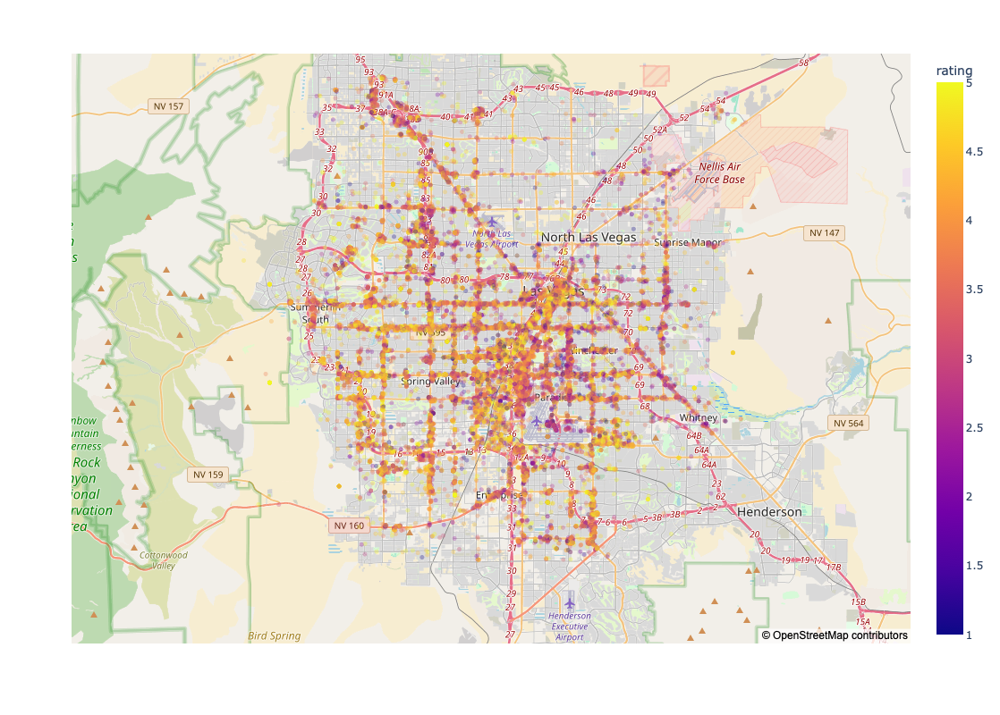

In [22]:
fig = px.scatter_mapbox(df_joined, lat="latitude", lon="longitude", color="rating", zoom=10, opacity=0.3, mapbox_style="open-street-map", width=800,
    height=800)
fig.show()
fig.write_html("df_joined.html")

Чтобы получить районы города, то есть разделить город на "клетки", округлите значения широты и долготы, подобрав оптимальный размер района. 

*Подсказка.* Например, можно сделать так
`np.round(долгота*4, decimals=1)*0.25`.

In [23]:
df_unrounded = df_joined.copy()

In [24]:
df_joined.latitude = np.round(df_joined.latitude*2, decimals=1)*0.5
df_joined.longitude = np.round(df_joined.longitude*2, decimals=1)*0.5
df_joined

,latitude,longitude,categories,name,rating,number_of_ratings
business_id,,,,,,
kCoE3jvEtg6UVz5SOD3GVw,36.20,-115.25,Real Estate Services;Real Estate;Home Services...,"""BDJ Realty""",4.000000,5
OD2hnuuTJI9uotcKycxg1A,36.20,-115.25,Shopping;Sporting Goods,"""Soccer Zone""",1.444444,9
VBHEsoXQb2AQ76J9l8h1uQ,36.10,-115.10,Shopping;Jewelry;Watch Repair;Local Services,"""Alfredo's Jewelry""",4.739130,23
1Jp_hmPNUZArNqzpbm7B0g,36.05,-115.25,Home Services;Lighting Fixtures & Equipment;Lo...,"""Task Electric""",4.450000,20
DPQnTnNw2PJj7DdENM98Cw,36.10,-115.05,Nurseries & Gardening;Home & Garden;Shopping,"""Star Nursery""",3.680000,25
...,...,...,...,...,...,...
swjz4q8gI79Ndg4APuHEUA,36.15,-115.20,Real Estate Services;Home Services;Property Ma...,"""Stonegate Real Estate Services""",4.466667,15
pUhU5ohYv65g8B47dTXAKA,36.15,-115.10,Coffee & Tea;Food,"""Starbucks""",2.400000,35
sH9WsMj8sNTTSAUWv4UEEg,36.05,-115.25,Mobile Phone Accessories;Mobile Phones;Electro...,"""Sprint Store""",3.857143,35


Для получения средней оценки компаний по району постройте сводную таблицу при помощи `pd.pivot_table`, взяв в качестве индексов и колонок округленные широту и долготу, а в качестве значений &mdash; оценки. Аггрегирующей функцией является среднее.

Изобразите полученную таблицу при помощи `sns.heatmap`.

*Замечание.* В качестве среднего можно было бы посчитать как общее среднее по всем оценкам всех компаний, так и среднее по компаниям их средних оценок. В чем разница этих подходов? Какой из них необходимо использовать в данном случае?

<Axes: xlabel='longitude', ylabel='latitude'>

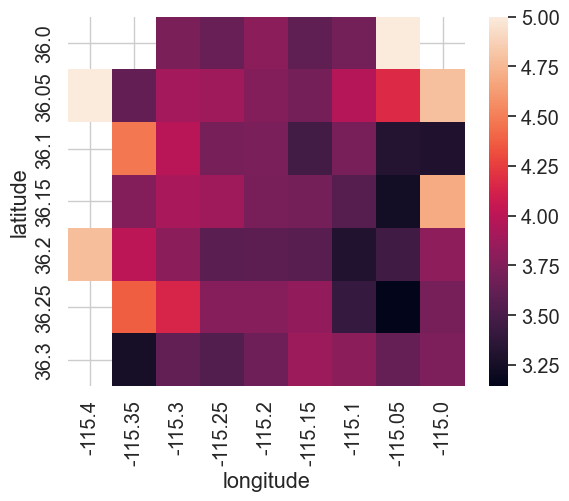

In [25]:
table = pd.pivot_table(df_joined, values='rating', index=['latitude'], columns=['longitude'], aggfunc='mean')
sns.heatmap(table)

**Разница между подходами:**
1) В качестве среднего можно было бы посчитать как общее среднее по всем оценкам всех компаний
2) В качестве среднего считать среднее по компаниям их средних оценок
в том, что первая отражает оценки заведений в конкретном районе, а 2 агрегированную оценку по сетям заведений, которые есть в районе.

В данном случае лучше смотреть на 2 показатель. 
Если смотреть на 1 показатель, то, например, у одного плохого заведения может быть много негативных отзывов, а у многих хороших заведений в районе мало отзывов, тогда несмотря на то, что в районе в основном хорошие заведения, рейтинг может быть плохим.
То есть одна точка не должна весить слишком много в итоговой формуле, а они должны весить одинаково, если мы хотим пронаблюдать агрегированный показатель.

Полученный график имеет ряд недостатков. Во-первых, не очень правильно судить о районе, если в нем мало компаний. Во-вторых,  на графике цветовая гамма автоматически подстроилась под минимальное и максимальное значения оценки.

Почему эти недостатки могут быть существенными?

**Ответ:** 

1) Если в районе мало компаний, то их может быть недостаточно, чтобы говорить о какой-либо закономерности. Данные могут быть единичными случаями.
2) Шкала линейная, но большинство точек находятся в диапазоне 3.25 - 4.25. Если бы был район с оценкой 1, шкала была также настроена, то она была бы "неравномерной", и, как следствие, еще менее наглядной.

Оставьте районы, в которых имеется информация о не менее $30$ компаний. Постройте новый график районов, использовав параметры `vmin` и `vmax` у функции `sns.heatmap`.

In [26]:
value_counts = df_joined.groupby(['latitude', 'longitude']).size()
df_joined_part = df_joined[df_joined.set_index(['latitude', 'longitude']).index.isin(value_counts.index[value_counts >= 30])]
df_joined_part

,latitude,longitude,categories,name,rating,number_of_ratings
business_id,,,,,,
kCoE3jvEtg6UVz5SOD3GVw,36.20,-115.25,Real Estate Services;Real Estate;Home Services...,"""BDJ Realty""",4.000000,5
OD2hnuuTJI9uotcKycxg1A,36.20,-115.25,Shopping;Sporting Goods,"""Soccer Zone""",1.444444,9
VBHEsoXQb2AQ76J9l8h1uQ,36.10,-115.10,Shopping;Jewelry;Watch Repair;Local Services,"""Alfredo's Jewelry""",4.739130,23
1Jp_hmPNUZArNqzpbm7B0g,36.05,-115.25,Home Services;Lighting Fixtures & Equipment;Lo...,"""Task Electric""",4.450000,20
DPQnTnNw2PJj7DdENM98Cw,36.10,-115.05,Nurseries & Gardening;Home & Garden;Shopping,"""Star Nursery""",3.680000,25
...,...,...,...,...,...,...
swjz4q8gI79Ndg4APuHEUA,36.15,-115.20,Real Estate Services;Home Services;Property Ma...,"""Stonegate Real Estate Services""",4.466667,15
pUhU5ohYv65g8B47dTXAKA,36.15,-115.10,Coffee & Tea;Food,"""Starbucks""",2.400000,35
sH9WsMj8sNTTSAUWv4UEEg,36.05,-115.25,Mobile Phone Accessories;Mobile Phones;Electro...,"""Sprint Store""",3.857143,35


<Axes: xlabel='longitude', ylabel='latitude'>

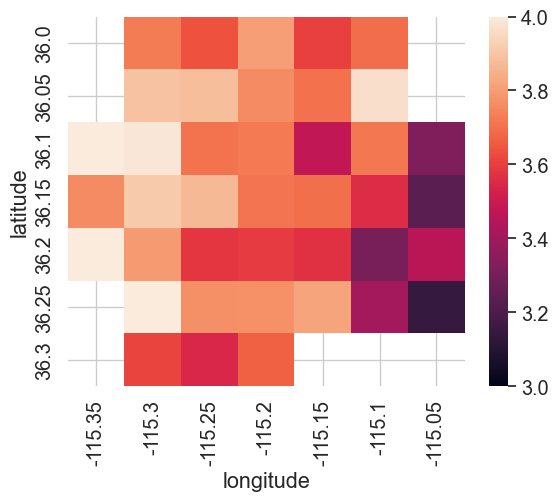

In [27]:
table = pd.pivot_table(df_joined_part, values='rating', index=['latitude'], columns=['longitude'], aggfunc='mean')
sns.heatmap(table, vmin=3.0, vmax=4.0)

Сравните полученный график с предыдущим и сделайте вывод.

**Вывод:**
На полученном графике отсеились окраины города.
Шкалы от 3 до 4 покрывает всю основную часть города, в то время как на преыдущем графике шкала была линейной с диапазоном от 3 до 5.
Большинство областей со средними оценками >4 - области, где мало оценок в целом.
Полученный график более наглядный.

#### 3. Рестораны

Будем считать компанию рестораном, если в поле `categories` *содержится* слово `restaurant`. Обратите внимание, что в анализе данных часто нет четкого формата данных. Например, данное слово может быть написано как с большой буквы, так и с маленькой; может как разделяться `;`, так и не разделяться. При возникновении недопонимания стоит посмотреть данные.

Составьте таблицу, в которой будет информация о всех ресторанах города `N`, для которых имеется не менее $5$ отзывов. Далее постройте heatmap-график районов, в котором каждому району сопоставьте среднюю оценку по ресторанам этого района. Рассматривайте только те районы, в которых есть не менее $10$ ресторанов, для каждого из которых есть не менее $5$ отзывов.

In [28]:
df_restaurant = df_joined[(df_joined['categories'].str.contains('Restaurant')) & (df_joined['number_of_ratings'] >= 5)]
df_restaurant

,latitude,longitude,categories,name,rating,number_of_ratings
business_id,,,,,,
Pd52CjgyEU3Rb8co6QfTPw,36.05,-115.15,Nightlife;Bars;Barbeque;Sports Bars;American (...,"""Flight Deck Bar & Grill""",3.769231,13
4srfPk1s8nlm1YusyDUbjg,36.05,-115.10,Fast Food;Restaurants;Sandwiches,"""Subway""",2.666667,6
n7V4cD-KqqE3OXk0irJTyA,36.05,-115.20,Arcades;Arts & Entertainment;Gastropubs;Restau...,"""GameWorks""",3.117479,349
Wpt0sFHcPtV5MO9He7yMKQ,36.15,-115.10,Restaurants;Fast Food;Burgers,"""McDonald's""",2.150000,20
W1Yr6c2XDx_RBjb6WsV-aQ,36.15,-115.20,Restaurants;Cafes;American (New);Bars;Nightlif...,"""Divine Cafe at the Springs Preserve""",4.050000,140
...,...,...,...,...,...,...
Kbbm6Vd5UdbP10dwjBghRw,36.05,-115.20,Restaurants;Fast Food;Burgers,"""In-N-Out Burger""",4.196078,255
UpW3jyJ3_kTG7oDSflwnMA,36.10,-115.25,Restaurants;Thai,"""Archi's Thai Kitchen""",3.994695,377
e2ApirIzYID9xIye0r_gKQ,36.25,-115.25,Salad;Breakfast & Brunch;Sandwiches;Burgers;Re...,"""Farmer Boys""",2.735955,178


In [29]:
value_counts = df_restaurant.groupby(['latitude', 'longitude']).size()
df_restaurant_part = df_restaurant[df_restaurant.set_index(['latitude', 'longitude']).index.isin(value_counts.index[value_counts >= 10])]

<Axes: xlabel='longitude', ylabel='latitude'>

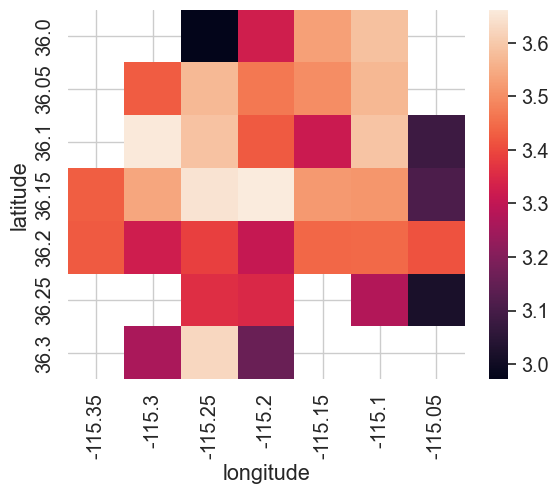

In [30]:
table_rest = pd.pivot_table(df_restaurant_part, values='rating', index=['latitude'], columns=['longitude'], aggfunc='mean')
sns.heatmap(table_rest)

Чем полезны ограничения снизу на количество отзывов для ресторана и количество ресторанов в районе?

**Ответ:**
Если отзывов или ресторанов мало, мы не можем говорить о таких вещах, как закономерностях и тенденциях.
Это может быть отзыв 1 посетителя не в настроении, или в отличном настроении, что вряд ли может сказать что-то о заведении наверняка.
Также как и одно заведение с оценками на районе вряд ли даст достоверную информацию о заведениях в районе в целом.

Кот Василий из города `N` очень придирчив к выбору ресторана. Он доверяет только ресторанам с высоким рейтингом, который основывается на большом количестве отзывов. Напечатайте в виде таблицы информацию $10$ ресторанах с самым большим рейтингом в порядке убывания рейтинга. Для каждого из этих ресторанов должно быть не менее $50$ отзывов. По каждому ресторану необходимо вывести следующую информации: название ресторана, средняя оценка, количество отзывов, географические координаты, категории.

In [31]:
df_best_restaurants = df_unrounded[(df_unrounded['categories'].str.contains('Restaurant')) & (df_unrounded['number_of_ratings'] >= 50)]
df_best_restaurants = df_best_restaurants.sort_values('rating', ascending=False)
df_best_restaurants.reset_index(inplace = True)

In [32]:
df_best_restaurants = df_best_restaurants[['name', 'rating', 'number_of_ratings', 'latitude', 'longitude', 'categories']]
df_for_cat = df_best_restaurants.head(10)
df_for_cat

,name,rating,number_of_ratings,latitude,longitude,categories
0,"""Lip Smacking Foodie Tours""",4.966480,179,36.114537,-115.172678,Food Tours;Restaurants;Event Planning & Servic...
1,"""Pepito Shack""",4.907692,65,36.152477,-115.151945,Restaurants;Burgers;Food Stands;Sandwiches;Hot...
2,"""Bosa Boba Cafe""",4.890909,55,36.125960,-115.184846,Vietnamese;Bubble Tea;Sandwiches;Food;Coffee &...
3,"""Garden Grill""",4.868132,91,36.166783,-115.286197,Tacos;Street Vendors;Farmers Market;Vegetarian...
4,"""Brew Tea Bar""",4.848069,1165,36.054195,-115.242443,Cafes;Tea Rooms;Food;Bubble Tea;Restaurants;De...
5,"""Poppa Naps BBQ""",4.836538,104,36.116549,-115.088115,Food Stands;Hot Dogs;Caterers;Restaurants;Amer...
6,"""Zenaida's Cafe""",4.833333,180,36.101741,-115.100359,Restaurants;Breakfast & Brunch;Cafes
7,"""El Frescos Cocina Mexicana""",4.816754,191,36.098527,-115.148446,Caterers;Mexican;Restaurants;Food;Event Planni...
8,"""Blaqcat Ultra Hookah Lounge""",4.809524,63,36.159742,-115.232738,Adult Entertainment;Lounges;Hookah Bars;Restau...
9,"""Smooth Eats""",4.807018,57,36.167894,-115.140238,Juice Bars & Smoothies;Restaurants;Sandwiches;...


Нанесите на карту все рестораны со средней оценкой не менее $4.7$, которая посчитана по не менее $50$ отзывам. Отдельным цветом отметьте 10 ресторанов, которые вы получили ранее.

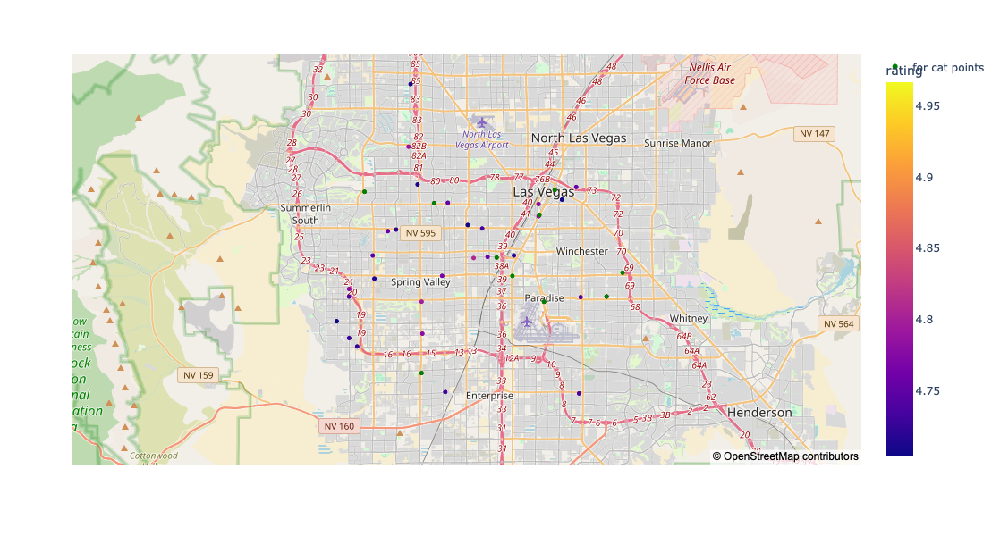

In [33]:
df_best_restaurants2 = df_best_restaurants[df_best_restaurants['rating'] >= 4.7]
fig = px.scatter_mapbox(df_best_restaurants2, lat="latitude", lon="longitude", color="rating", zoom=10, mapbox_style="open-street-map", width=600,
    height=600)
fig.add_scattermapbox(lat=df_for_cat['latitude'], lon=df_for_cat['longitude'], marker={'color': 'green'}, name='for cat points')
fig.show()
fig.write_html("df_for_cat.html")

Охарактеризуйте кота Василия, а также сделайте общий вывод по задаче.

**Вывод:** Похвалите кота

В задаче рассмотрены компании Лос-Анжелеса. Построена интерактивная карта по рейтингу заведений.
Составлены heatmap, сравнивающие различные районы Лос-Анжелеса между собой в зависимости от рейтинга заведения.
Также детально по районам проанализированы рестораны. Лучший ресторан в городе - "Lip Smacking Foodie Tours".